In [3]:
import os
import pandas as pd
import seaborn as sns
import numpy as np
from skimage import io
import matplotlib.pyplot as plt
import matplotlib.pylab as pl
from skimage.filters import sobel, sobel_h, sobel_v
import glob
import re

# Check that the residual tilt has no impact on the best position

29 29 29


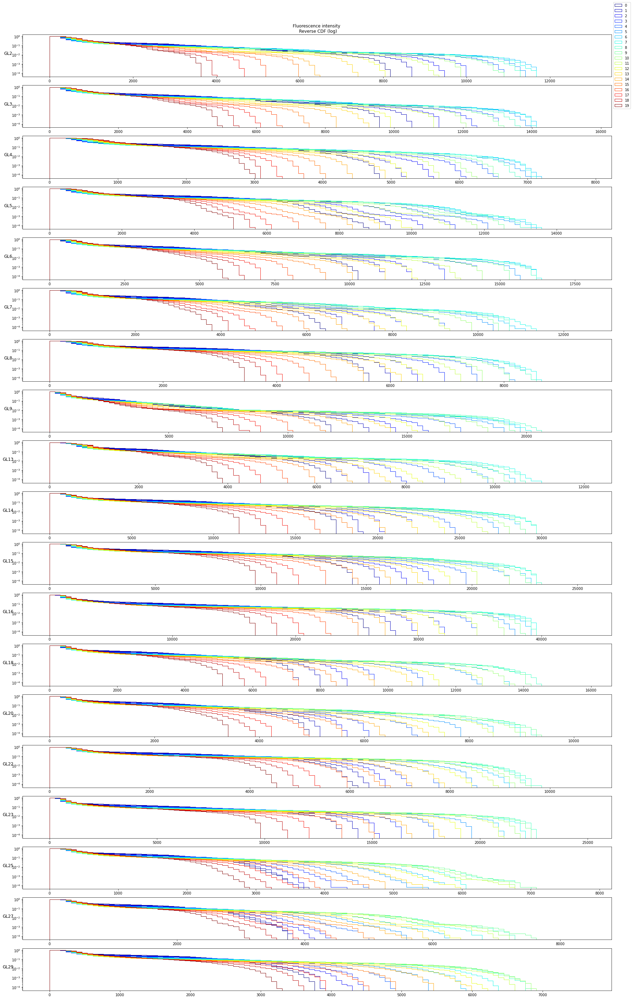

In [20]:
gl=str(1)
top_cutoff=120
rootPath="/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220824/20220824_ace_downwards_1_preproc/"
glRange=range(1,30)
fileListList=[]
posListList=[]
n=19
k=0
gls=[]

for gl in glRange:
    #print(glob.glob(rootPath+"/**/**/*GL%s.tif"%(str(gl))))
    fileList=glob.glob(rootPath+"/**/**/*GL%s.tif"%(str(gl)))
    #order the list by positions
    if fileList != []:
        posList=[int(re.search("Pos([0-9]{1,})",f).group(1)) for f in fileList]
        fileList=[x for _,x in sorted(zip(posList,fileList))]
        posList=sorted(posList)
        fileListList=fileListList+[fileList]
        posListList=posListList+[posList]
        gls+=[str(gl)]
        
## Setting color map
col = pl.cm.jet([0.25,0.75])  
colors = pl.cm.jet(np.linspace(0,1,n+1))

print(len(gls),len(fileListList),len(posListList))


fluo_filter=[True]*len(gls)
vmax_fluo_list=[0]*len(gls)
for m,fs in zip(range(0,len(gls)),fileListList):
    
    #vmax_fluo=0
    for f,p in zip(fs,posListList[m]):
        im = io.imread(f)
        vmax_fluo_list[m]=np.max([vmax_fluo_list[m],np.max(im[0, top_cutoff:,:,2])*1.1])        

indices=[i for i in range(0,len(gls)) if vmax_fluo_list[i]>3000]

fig,axs=plt.subplots(len(indices),1,squeeze=False)
fig.set_size_inches(30,50)
for h,m in zip(range(0,len(indices)),indices):
    fs=fileListList[m]
    #print(len(fs))
    matrices_array_gfp=np.array([io.imread(f)[0,top_cutoff:,:,2] for f in fs])
    for i in range(0,len(fs)):
        axs[h,0].hist(matrices_array_gfp[i,:,:].flatten(),bins=np.linspace(0,vmax_fluo_list[m],100),density=True, histtype='step', cumulative=-1,label='Reversed emp.',log=True,color=colors[i])
        axs[h,0].set_ylabel("GL%s"%(gls[m]),size="large",rotation=0,labelpad=10)


axs[0,0].legend(posList,loc='center left', bbox_to_anchor=(1, 0.5))
axs[0,0].set_title("Fluorescence intensity \n Reverse CDF (log)")

plt.savefig("./plot_all_distributions_across_gls_downwards.pdf",bbox_inches='tight')
plt.show()

29 29 29


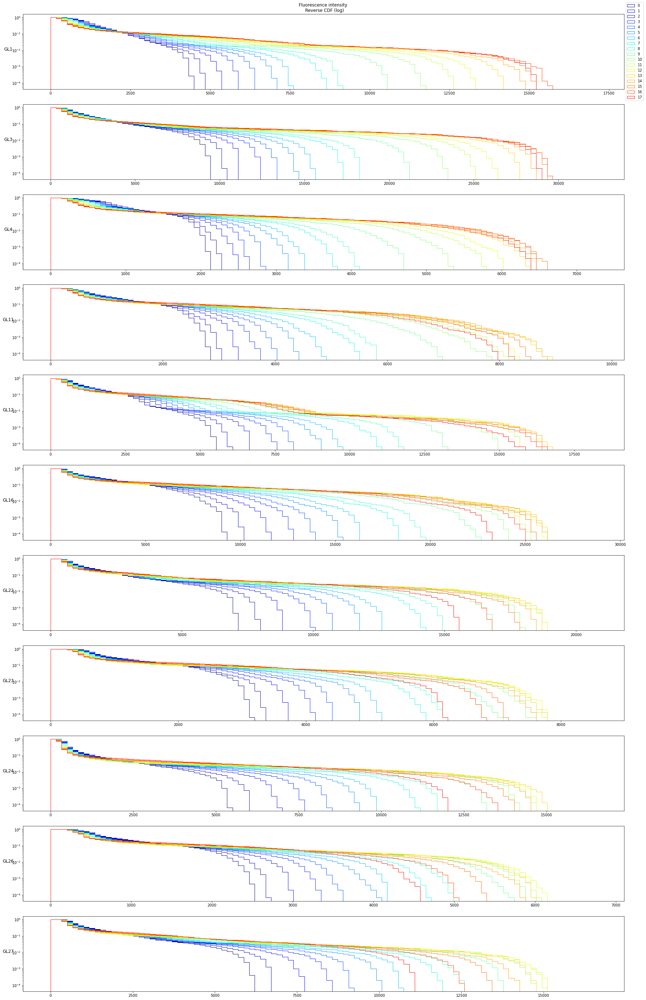

In [21]:
gl=str(1)
top_cutoff=120
rootPath="/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220824/20220824_ace_upwards_1_preproc/"
glRange=range(1,30)
fileListList=[]
posListList=[]
n=19
k=0
gls=[]

for gl in glRange:
    #print(glob.glob(rootPath+"/**/**/*GL%s.tif"%(str(gl))))
    fileList=glob.glob(rootPath+"/**/**/*GL%s.tif"%(str(gl)))
    #order the list by positions
    if fileList != []:
        posList=[int(re.search("Pos([0-9]{1,})",f).group(1)) for f in fileList]
        fileList=[x for _,x in sorted(zip(posList,fileList))]
        posList=sorted(posList)
        fileListList=fileListList+[fileList]
        posListList=posListList+[posList]
        gls+=[str(gl)]
        
## Setting color map
col = pl.cm.jet([0.25,0.75])  
colors = pl.cm.jet(np.linspace(0,1,n+1))

print(len(gls),len(fileListList),len(posListList))


fluo_filter=[True]*len(gls)
vmax_fluo_list=[0]*len(gls)
for m,fs in zip(range(0,len(gls)),fileListList):
    
    #vmax_fluo=0
    for f,p in zip(fs,posListList[m]):
        im = io.imread(f)
        vmax_fluo_list[m]=np.max([vmax_fluo_list[m],np.max(im[0, top_cutoff:,:,2])*1.1])        

indices=[i for i in range(0,len(gls)) if vmax_fluo_list[i]>3000]

fig,axs=plt.subplots(len(indices),1,squeeze=False)
fig.set_size_inches(30,50)
for h,m in zip(range(0,len(indices)),indices):
    fs=fileListList[m]
    #print(len(fs))
    matrices_array_gfp=np.array([io.imread(f)[0,top_cutoff:,:,2] for f in fs])
    for i in range(0,len(fs)):
        axs[h,0].hist(matrices_array_gfp[i,:,:].flatten(),bins=np.linspace(0,vmax_fluo_list[m],100),density=True, histtype='step', cumulative=-1,label='Reversed emp.',log=True,color=colors[i])
        axs[h,0].set_ylabel("GL%s"%(gls[m]),size="large",rotation=0,labelpad=10)


axs[0,0].legend(posList,loc='center left', bbox_to_anchor=(1, 0.5))
axs[0,0].set_title("Fluorescence intensity \n Reverse CDF (log)")

plt.savefig("./plot_all_distributions_across_gls_upwards.pdf",bbox_inches='tight')
plt.show()

In [25]:
def plot_results(gl):
    rootPath="/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220824/20220824_ace_downwards_1_preproc/"
    fileList=glob.glob(rootPath+"/**/**/*GL%s.tif"%(gl))
    #order the list by positions
    posList=[int(re.search("Pos([0-9]{1,})",f).group(1)) for f in fileList]
    fileList=[x for _,x in sorted(zip(posList,fileList))]
    posList=sorted(posList)
    #[x for _, x in sorted(zip(Y, X))]
    print(posList,fileList)
    #posList=posList[0:2]
    #fileList=fileList[0:2]
    top_cutoff=120
    # Overview of positions and distributions
    fig,axs=plt.subplots(len(fileList),6,gridspec_kw={'width_ratios': [1,4,1,4,1,4]})
    fig.set_size_inches(20,50)
    #fig.set_dpi(300)
    
    k=0
    vmax_phc=0#np.max(im[0, :,:,0])*1.1
    vmax_sobel=0#np.max(im_sobel)*1.1
    vmax_fluo=0#np.max(im[0, :,:,1])*1.1
    
    vmin_phc=0#np.max(im[0, :,:,0])*1.1
    vmin_sobel=0#np.max(im_sobel)*1.1
    vmin_fluo=0#np.max(im[0, :,:,1])*1.1
    
    #searching for max to plot
    for f,p in zip(fileList,posList):
      im = io.imread(f)
      im_sobel = np.abs(sobel_v(im[0, top_cutoff:,:,0]))
      vmax_phc=np.max([vmax_phc,np.max(im[0, top_cutoff:,:,0])*1.1])
      vmax_sobel=np.max([vmax_sobel,np.max(im_sobel)*1.1])
      vmax_fluo=np.max([vmax_fluo,np.max(im[0, top_cutoff:,:,2])*1.1])
    
      vmin_phc=np.min([vmin_phc,np.min(im[0, top_cutoff:,:,0])*0.9])
      vmin_sobel=np.min([vmin_sobel,np.min(im_sobel)*0.9])
      vmin_fluo=np.min([vmin_fluo,np.min(im[0, top_cutoff:,:,2])*0.9])
        
      #print(f)
      #print(np.max(im_sobel))

    for f,p in zip(fileList,posList):
      im = io.imread(f)
      im_sobel = np.abs(sobel_v(im[0, top_cutoff:,:,0]))                                     
      #print("Pos"+str(p)+", phase contrast")
      axs[k,0].set_ylabel(p,size="large",rotation=0,labelpad=10)
      axs[k,0].imshow(im[0, top_cutoff:,:,0],vmin=np.min(im[0,top_cutoff:,:,0]),vmax=np.max(im[0, top_cutoff:,:,0]),cmap='gray')
      #plt.show()
      axs[k,1].hist(im[0, top_cutoff:,:,0].flatten(),bins=np.linspace(vmin_phc,vmax_phc,100),density=True, histtype='step',cumulative=-1,
        label='Reversed emp.',log=True)  
      axs[k,1].set_xlim(vmin_phc,vmax_phc)
      axs[k,2].imshow(im_sobel,vmin=np.min(im_sobel),vmax=np.max(im_sobel),cmap='gray')
      axs[k,3].hist(im_sobel.flatten(),bins=np.linspace(vmin_sobel,vmax_sobel,100),density=True, histtype='step', cumulative=-1,
        label='Reversed emp.',log=True)
      axs[k,3].set_xlim(0,vmax_sobel)
      #plt.yscale('log')
      axs[k,4].imshow(im[0,top_cutoff:,:,2],vmin=np.min(im[0, top_cutoff:,:,2]),vmax=np.max(im[0, top_cutoff:,:,2]),cmap='gray')
      axs[k,5].hist(im[0,top_cutoff:,:,2].flatten(),bins=np.linspace(vmin_fluo,vmax_fluo,100),density=True, histtype='step', cumulative=-1,
        label='Reversed emp.',log=True)
      axs[k,5].set_xlim(vmin_fluo,vmax_fluo)

      #print(np.max(im[0,:,:,0]))
      #print("Pos"+str(p)+", sobel filter")
      #plt.show()
      k+=1

    for i in range(0,np.shape(axs)[0]):
        for j in range(0,np.shape(axs)[1]):
          axs[i,j].set_yticks([])
          axs[i,j].set_xticks([])

    plt.subplots_adjust(left=0.1,
                        bottom=0.1, 
                        right=0.9, 
                        top=0.9, 
                        wspace=0.1, 
                        hspace=0.1)

    plt.savefig("./plot_downwards_%s.pdf"%(gl))
    plt.show()

    # Super imposing distributions (sobel filter, phase contrast and gfp intensities)
    ## Setting color map
    n=len(fileList)
    col = pl.cm.jet([0.25,0.75])  
    colors = pl.cm.jet(np.linspace(0,1,n))


    fig,axs=plt.subplots(3)
    fig.set_dpi(300)
    
    
    ## List of matrices
    matrices_array_phc=np.array([io.imread(f)[0,top_cutoff:,:,0] for f in fileList])
    np.shape(matrices_array_phc)
    # Plotting sobel results
    for i in range(0,np.shape(matrices_array_phc)[0]):
      #print(fileList[i])
      #print(np.max(matrices_array_sobel[i,:,:]))
      #print(matrices_array_sobel[i,:,:])
      axs[0].hist(matrices_array_phc[i,:,:].flatten(),bins=np.linspace(vmin_phc,vmax_phc,100),density=True, histtype='step', cumulative=-1,
        label='Reversed emp.',log=True,color=colors[i])
    #axs[0].legend(posList,loc='center left', bbox_to_anchor=(1, 0.5))
    axs[0].set_title("Phase contrast data \n Reverse CDF (log)")

    ## List of matrices
    matrices_array_sobel=np.array([np.abs(sobel_v(io.imread(f)[0,top_cutoff:,:,0])) for f in fileList])
    np.shape(matrices_array_sobel)
    # Plotting sobel results
    for i in range(0,np.shape(matrices_array_sobel)[0]):
      #print(fileList[i])
      #print(np.max(matrices_array_sobel[i,:,:]))
      #print(matrices_array_sobel[i,:,:])
      axs[1].hist(matrices_array_sobel[i,:,:].flatten(),bins=np.linspace(vmin_sobel,vmax_sobel,100),density=True, histtype='step', cumulative=-1,
        label='Reversed emp.',log=True,color=colors[i])
    axs[1].legend(posList,loc='center left', bbox_to_anchor=(1, 0.5))
    axs[1].set_title("Sobel filtered phase contrast data \n Reverse CDF (log)")

    # Plotting gfp intensities results
    matrices_array_gfp=np.array([io.imread(f)[0,top_cutoff:,:,2] for f in fileList])
    #np.shape(matrices_array_gfp)
    for i in range(0,np.shape(matrices_array_gfp)[0]):
      axs[2].hist(matrices_array_gfp[i,:,:].flatten(),bins=np.linspace(vmin_fluo,vmax_fluo,100),density=True, histtype='step', cumulative=-1,
        label='Reversed emp.',log=True,color=colors[i])
    #axs[1].legend(posList,loc='center left', bbox_to_anchor=(1, 0.5))
    axs[2].set_title("Fluorescence intensity \n Reverse CDF (log)")
    #fig.tight_layout()
    plt.subplots_adjust(wspace=0.1, 
                        hspace=1)
    plt.savefig("./plot_all_distributions_downwards_%s.pdf"%(gl),bbox_inches='tight')
    plt.show()

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19] ['/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220824/20220824_ace_downwards_1_preproc/Pos0/Pos0_GL2/20220824_ace_downwards_1_MMStack_Pos0_GL2.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220824/20220824_ace_downwards_1_preproc/Pos1/Pos1_GL2/20220824_ace_downwards_1_MMStack_Pos1_GL2.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220824/20220824_ace_downwards_1_preproc/Pos2/Pos2_GL2/20220824_ace_downwards_1_MMStack_Pos2_GL2.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220824/20220824_ace_downwards_1_preproc/Pos3/Pos3_GL2/20220824_ace_downwards_1_MMStack_Pos3_GL2.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220824/20220824_ace_downwards_1_preproc/Pos4/Pos4_GL2/20220824_ace_downwards_1_MMStack_Pos4_GL2.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220824/20220824_ace_downwards_1_preproc/Pos5/Pos5_GL2/20220824_ace_downwards_1_MMStack_Pos5_GL2.tif', '/scicore/home/nimwegen/roca

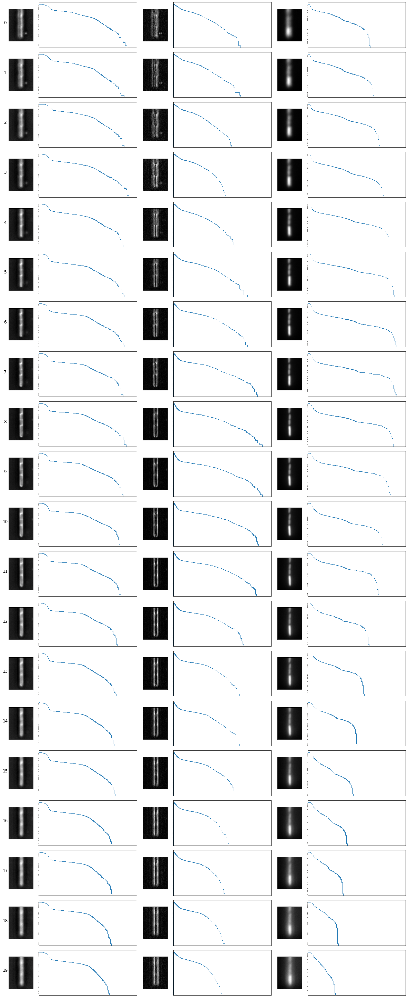

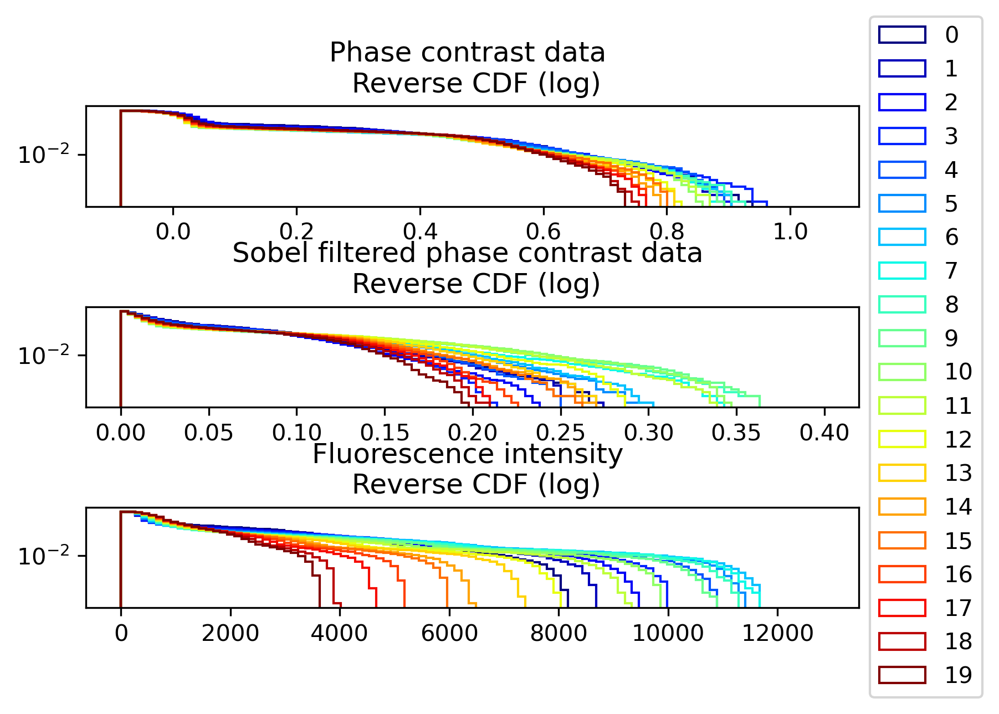

In [26]:
#extreme right gl
gl1=str(2)
plot_results(gl1)

In [27]:
def plot_results(gl):
    rootPath="/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220824/20220824_ace_upwards_1_preproc/"
    fileList=glob.glob(rootPath+"/**/**/*GL%s.tif"%(gl))
    #order the list by positions
    posList=[int(re.search("Pos([0-9]{1,})",f).group(1)) for f in fileList]
    fileList=[x for _,x in sorted(zip(posList,fileList))]
    posList=sorted(posList)
    #[x for _, x in sorted(zip(Y, X))]
    print(posList,fileList)
    #posList=posList[0:2]
    #fileList=fileList[0:2]
    top_cutoff=120
    # Overview of positions and distributions
    fig,axs=plt.subplots(len(fileList),6,gridspec_kw={'width_ratios': [1,4,1,4,1,4]})
    fig.set_size_inches(20,50)
    #fig.set_dpi(300)
    
    k=0
    vmax_phc=0#np.max(im[0, :,:,0])*1.1
    vmax_sobel=0#np.max(im_sobel)*1.1
    vmax_fluo=0#np.max(im[0, :,:,1])*1.1
    
    vmin_phc=0#np.max(im[0, :,:,0])*1.1
    vmin_sobel=0#np.max(im_sobel)*1.1
    vmin_fluo=0#np.max(im[0, :,:,1])*1.1
    
    #searching for max to plot
    for f,p in zip(fileList,posList):
      im = io.imread(f)
      im_sobel = np.abs(sobel_v(im[0, top_cutoff:,:,0]))
      vmax_phc=np.max([vmax_phc,np.max(im[0, top_cutoff:,:,0])*1.1])
      vmax_sobel=np.max([vmax_sobel,np.max(im_sobel)*1.1])
      vmax_fluo=np.max([vmax_fluo,np.max(im[0, top_cutoff:,:,2])*1.1])
    
      vmin_phc=np.min([vmin_phc,np.min(im[0, top_cutoff:,:,0])*0.9])
      vmin_sobel=np.min([vmin_sobel,np.min(im_sobel)*0.9])
      vmin_fluo=np.min([vmin_fluo,np.min(im[0, top_cutoff:,:,2])*0.9])
        
      #print(f)
      #print(np.max(im_sobel))

    for f,p in zip(fileList,posList):
      im = io.imread(f)
      im_sobel = np.abs(sobel_v(im[0, top_cutoff:,:,0]))                                     
      #print("Pos"+str(p)+", phase contrast")
      axs[k,0].set_ylabel(p,size="large",rotation=0,labelpad=10)
      axs[k,0].imshow(im[0, top_cutoff:,:,0],vmin=np.min(im[0,top_cutoff:,:,0]),vmax=np.max(im[0, top_cutoff:,:,0]),cmap='gray')
      #plt.show()
      axs[k,1].hist(im[0, top_cutoff:,:,0].flatten(),bins=np.linspace(vmin_phc,vmax_phc,100),density=True, histtype='step',cumulative=-1,
        label='Reversed emp.',log=True)  
      axs[k,1].set_xlim(vmin_phc,vmax_phc)
      axs[k,2].imshow(im_sobel,vmin=np.min(im_sobel),vmax=np.max(im_sobel),cmap='gray')
      axs[k,3].hist(im_sobel.flatten(),bins=np.linspace(vmin_sobel,vmax_sobel,100),density=True, histtype='step', cumulative=-1,
        label='Reversed emp.',log=True)
      axs[k,3].set_xlim(0,vmax_sobel)
      #plt.yscale('log')
      axs[k,4].imshow(im[0,top_cutoff:,:,2],vmin=np.min(im[0, top_cutoff:,:,2]),vmax=np.max(im[0, top_cutoff:,:,2]),cmap='gray')
      axs[k,5].hist(im[0,top_cutoff:,:,2].flatten(),bins=np.linspace(vmin_fluo,vmax_fluo,100),density=True, histtype='step', cumulative=-1,
        label='Reversed emp.',log=True)
      axs[k,5].set_xlim(vmin_fluo,vmax_fluo)

      #print(np.max(im[0,:,:,0]))
      #print("Pos"+str(p)+", sobel filter")
      #plt.show()
      k+=1

    for i in range(0,np.shape(axs)[0]):
        for j in range(0,np.shape(axs)[1]):
          axs[i,j].set_yticks([])
          axs[i,j].set_xticks([])

    plt.subplots_adjust(left=0.1,
                        bottom=0.1, 
                        right=0.9, 
                        top=0.9, 
                        wspace=0.1, 
                        hspace=0.1)

    plt.savefig("./plot_upwards_%s.pdf"%(gl))
    plt.show()

    # Super imposing distributions (sobel filter, phase contrast and gfp intensities)
    ## Setting color map
    n=len(fileList)
    col = pl.cm.jet([0.25,0.75])  
    colors = pl.cm.jet(np.linspace(0,1,n))


    fig,axs=plt.subplots(3)
    fig.set_dpi(300)
    
    
    ## List of matrices
    matrices_array_phc=np.array([io.imread(f)[0,top_cutoff:,:,0] for f in fileList])
    np.shape(matrices_array_phc)
    # Plotting sobel results
    for i in range(0,np.shape(matrices_array_phc)[0]):
      #print(fileList[i])
      #print(np.max(matrices_array_sobel[i,:,:]))
      #print(matrices_array_sobel[i,:,:])
      axs[0].hist(matrices_array_phc[i,:,:].flatten(),bins=np.linspace(vmin_phc,vmax_phc,100),density=True, histtype='step', cumulative=-1,
        label='Reversed emp.',log=True,color=colors[i])
    #axs[0].legend(posList,loc='center left', bbox_to_anchor=(1, 0.5))
    axs[0].set_title("Phase contrast data \n Reverse CDF (log)")

    ## List of matrices
    matrices_array_sobel=np.array([np.abs(sobel_v(io.imread(f)[0,top_cutoff:,:,0])) for f in fileList])
    np.shape(matrices_array_sobel)
    # Plotting sobel results
    for i in range(0,np.shape(matrices_array_sobel)[0]):
      #print(fileList[i])
      #print(np.max(matrices_array_sobel[i,:,:]))
      #print(matrices_array_sobel[i,:,:])
      axs[1].hist(matrices_array_sobel[i,:,:].flatten(),bins=np.linspace(vmin_sobel,vmax_sobel,100),density=True, histtype='step', cumulative=-1,
        label='Reversed emp.',log=True,color=colors[i])
    axs[1].legend(posList,loc='center left', bbox_to_anchor=(1, 0.5))
    axs[1].set_title("Sobel filtered phase contrast data \n Reverse CDF (log)")

    # Plotting gfp intensities results
    matrices_array_gfp=np.array([io.imread(f)[0,top_cutoff:,:,2] for f in fileList])
    #np.shape(matrices_array_gfp)
    for i in range(0,np.shape(matrices_array_gfp)[0]):
      axs[2].hist(matrices_array_gfp[i,:,:].flatten(),bins=np.linspace(vmin_fluo,vmax_fluo,100),density=True, histtype='step', cumulative=-1,
        label='Reversed emp.',log=True,color=colors[i])
    #axs[1].legend(posList,loc='center left', bbox_to_anchor=(1, 0.5))
    axs[2].set_title("Fluorescence intensity \n Reverse CDF (log)")
    #fig.tight_layout()
    plt.subplots_adjust(wspace=0.1, 
                        hspace=1)
    plt.savefig("./plot_all_distributions_upwards_%s.pdf"%(gl),bbox_inches='tight')
    plt.show()

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17] ['/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220824/20220824_ace_upwards_1_preproc/Pos0/Pos0_GL27/20220824_ace_upwards_1_MMStack_Pos0_GL27.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220824/20220824_ace_upwards_1_preproc/Pos1/Pos1_GL27/20220824_ace_upwards_1_MMStack_Pos1_GL27.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220824/20220824_ace_upwards_1_preproc/Pos2/Pos2_GL27/20220824_ace_upwards_1_MMStack_Pos2_GL27.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220824/20220824_ace_upwards_1_preproc/Pos3/Pos3_GL27/20220824_ace_upwards_1_MMStack_Pos3_GL27.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220824/20220824_ace_upwards_1_preproc/Pos4/Pos4_GL27/20220824_ace_upwards_1_MMStack_Pos4_GL27.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220824/20220824_ace_upwards_1_preproc/Pos5/Pos5_GL27/20220824_ace_upwards_1_MMStack_Pos5_GL27.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20

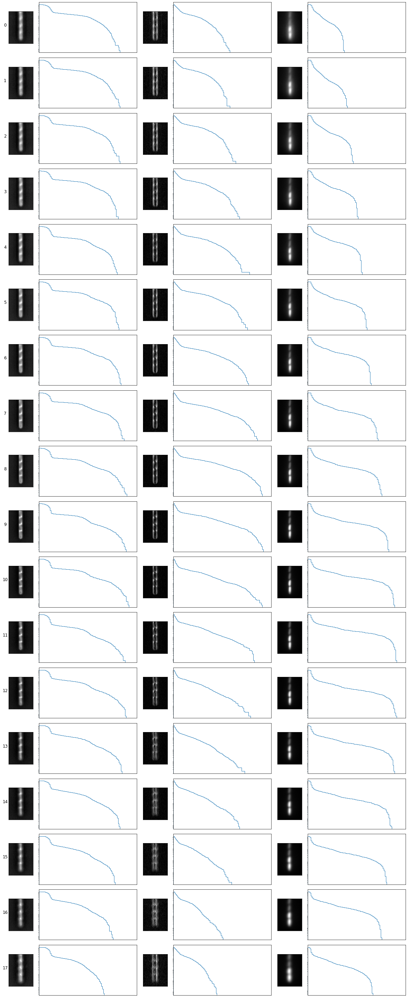

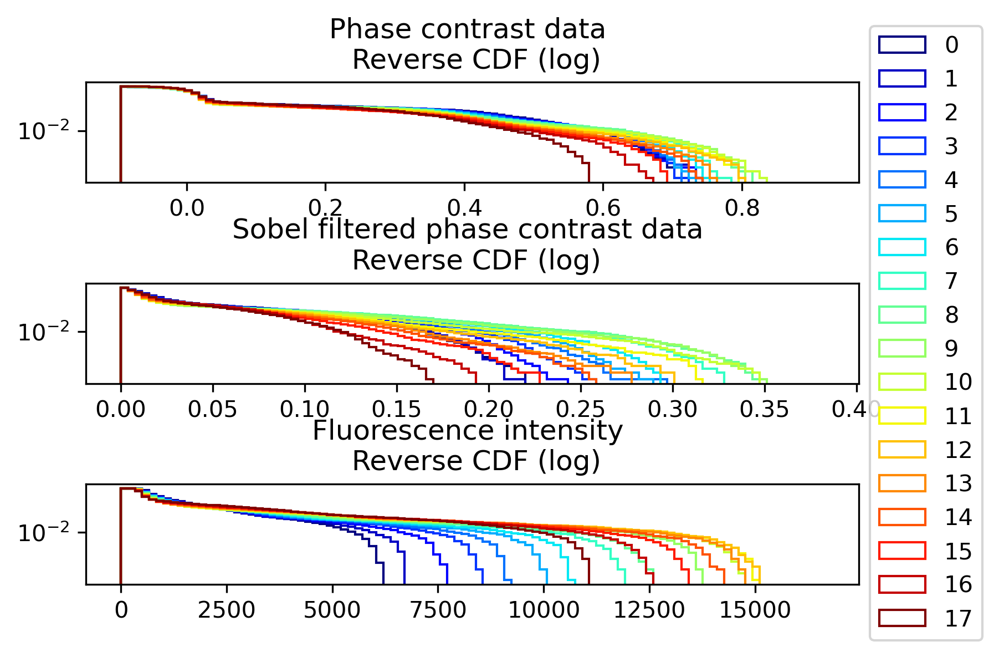

In [29]:
#extreme left growth lane
gl1=str(27)
plot_results(gl1)

# Same analysis but end of the experiment, GL29, 16,1

In [195]:
def plot_results(gl):
    rootPath="/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220819_ace/20220819_ace_zstacks_1_1_preproc/"
    fileList=glob.glob(rootPath+"/**/**/*GL%s.tif"%(gl))
    #order the list by positions
    posList=[int(re.search("Pos([0-9]{1,})",f).group(1)) for f in fileList]
    fileList=[x for _,x in sorted(zip(posList,fileList))]
    posList=sorted(posList)
    #[x for _, x in sorted(zip(Y, X))]
    print(posList,fileList)
    #posList=posList[0:2]
    #fileList=fileList[0:2]
    top_cutoff=120
    # Overview of positions and distributions
    fig,axs=plt.subplots(len(fileList),6,gridspec_kw={'width_ratios': [1,4,1,4,1,4]})
    fig.set_size_inches(20,50)
    #fig.set_dpi(300)
    
    k=0
    vmax_phc=0#np.max(im[0, :,:,0])*1.1
    vmax_sobel=0#np.max(im_sobel)*1.1
    vmax_fluo=0#np.max(im[0, :,:,1])*1.1
    
    vmin_phc=0#np.max(im[0, :,:,0])*1.1
    vmin_sobel=0#np.max(im_sobel)*1.1
    vmin_fluo=0#np.max(im[0, :,:,1])*1.1
    
    #searching for max to plot
    for f,p in zip(fileList,posList):
      im = io.imread(f)
      im_sobel = np.abs(sobel_v(im[0, top_cutoff:,:,0]))
      vmax_phc=np.max([vmax_phc,np.max(im[0, top_cutoff:,:,0])*1.1])
      vmax_sobel=np.max([vmax_sobel,np.max(im_sobel)*1.1])
      vmax_fluo=np.max([vmax_fluo,np.max(im[0, top_cutoff:,:,2])*1.1])
    
      vmin_phc=np.min([vmin_phc,np.min(im[0, top_cutoff:,:,0])*0.9])
      vmin_sobel=np.min([vmin_sobel,np.min(im_sobel)*0.9])
      vmin_fluo=np.min([vmin_fluo,np.min(im[0, top_cutoff:,:,2])*0.9])
        
      #print(f)
      #print(np.max(im_sobel))

    for f,p in zip(fileList,posList):
      im = io.imread(f)
      im_sobel = np.abs(sobel_v(im[0, top_cutoff:,:,0]))                                     
      #print("Pos"+str(p)+", phase contrast")
      axs[k,0].set_ylabel(p,size="large",rotation=0,labelpad=10)
      axs[k,0].imshow(im[0, top_cutoff:,:,0],vmin=np.min(im[0,top_cutoff:,:,0]),vmax=np.max(im[0, top_cutoff:,:,0]),cmap='gray')
      #plt.show()
      axs[k,1].hist(im[0, top_cutoff:,:,0].flatten(),bins=np.linspace(vmin_phc,vmax_phc,100),density=True, histtype='step',cumulative=-1,
        label='Reversed emp.',log=True)  
      axs[k,1].set_xlim(vmin_phc,vmax_phc)
      axs[k,2].imshow(im_sobel,vmin=np.min(im_sobel),vmax=np.max(im_sobel),cmap='gray')
      axs[k,3].hist(im_sobel.flatten(),bins=np.linspace(vmin_sobel,vmax_sobel,100),density=True, histtype='step', cumulative=-1,
        label='Reversed emp.',log=True)
      axs[k,3].set_xlim(0,vmax_sobel)
      #plt.yscale('log')
      axs[k,4].imshow(im[0,top_cutoff:,:,2],vmin=np.min(im[0, top_cutoff:,:,2]),vmax=np.max(im[0, top_cutoff:,:,2]),cmap='gray')
      axs[k,5].hist(im[0,top_cutoff:,:,2].flatten(),bins=np.linspace(vmin_fluo,vmax_fluo,100),density=True, histtype='step', cumulative=-1,
        label='Reversed emp.',log=True)
      axs[k,5].set_xlim(vmin_fluo,vmax_fluo)

      #print(np.max(im[0,:,:,0]))
      #print("Pos"+str(p)+", sobel filter")
      #plt.show()
      k+=1

    for i in range(0,np.shape(axs)[0]):
        for j in range(0,np.shape(axs)[1]):
          axs[i,j].set_yticks([])
          axs[i,j].set_xticks([])

    plt.subplots_adjust(left=0.1,
                        bottom=0.1, 
                        right=0.9, 
                        top=0.9, 
                        wspace=0.1, 
                        hspace=0.1)

    plt.savefig("./plot_downwards_%s.pdf"%(gl))
    plt.show()

    # Super imposing distributions (sobel filter, phase contrast and gfp intensities)
    ## Setting color map
    n=len(fileList)
    col = pl.cm.jet([0.25,0.75])  
    colors = pl.cm.jet(np.linspace(0,1,n))


    fig,axs=plt.subplots(3)
    fig.set_dpi(300)
    
    
    ## List of matrices
    matrices_array_phc=np.array([io.imread(f)[0,top_cutoff:,:,0] for f in fileList])
    np.shape(matrices_array_phc)
    # Plotting sobel results
    for i in range(0,np.shape(matrices_array_phc)[0]):
      #print(fileList[i])
      #print(np.max(matrices_array_sobel[i,:,:]))
      #print(matrices_array_sobel[i,:,:])
      axs[0].hist(matrices_array_phc[i,:,:].flatten(),bins=np.linspace(vmin_phc,vmax_phc,100),density=True, histtype='step', cumulative=-1,
        label='Reversed emp.',log=True,color=colors[i])
    #axs[0].legend(posList,loc='center left', bbox_to_anchor=(1, 0.5))
    axs[0].set_title("Phase contrast data \n Reverse CDF (log)")

    ## List of matrices
    matrices_array_sobel=np.array([np.abs(sobel_v(io.imread(f)[0,top_cutoff:,:,0])) for f in fileList])
    np.shape(matrices_array_sobel)
    # Plotting sobel results
    for i in range(0,np.shape(matrices_array_sobel)[0]):
      #print(fileList[i])
      #print(np.max(matrices_array_sobel[i,:,:]))
      #print(matrices_array_sobel[i,:,:])
      axs[1].hist(matrices_array_sobel[i,:,:].flatten(),bins=np.linspace(vmin_sobel,vmax_sobel,100),density=True, histtype='step', cumulative=-1,
        label='Reversed emp.',log=True,color=colors[i])
    axs[1].legend(posList,loc='center left', bbox_to_anchor=(1, 0.5))
    axs[1].set_title("Sobel filtered phase contrast data \n Reverse CDF (log)")

    # Plotting gfp intensities results
    matrices_array_gfp=np.array([io.imread(f)[0,top_cutoff:,:,2] for f in fileList])
    #np.shape(matrices_array_gfp)
    for i in range(0,np.shape(matrices_array_gfp)[0]):
      axs[2].hist(matrices_array_gfp[i,:,:].flatten(),bins=np.linspace(vmin_fluo,vmax_fluo,100),density=True, histtype='step', cumulative=-1,
        label='Reversed emp.',log=True,color=colors[i])
    #axs[1].legend(posList,loc='center left', bbox_to_anchor=(1, 0.5))
    axs[2].set_title("Fluorescence intensity \n Reverse CDF (log)")
    #fig.tight_layout()
    plt.subplots_adjust(wspace=0.1, 
                        hspace=1)
    plt.savefig("./plot_all_distributions_downwards_%s.pdf"%(gl),bbox_inches='tight')
    plt.show()

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18] ['/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220819_ace/20220819_ace_zstacks_1_1_preproc/Pos0/Pos0_GL29/20220819_ace_zstacks_downwards_1_1_MMStack_Pos0_GL29.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220819_ace/20220819_ace_zstacks_1_1_preproc/Pos1/Pos1_GL29/20220819_ace_zstacks_downwards_1_1_MMStack_Pos1_GL29.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220819_ace/20220819_ace_zstacks_1_1_preproc/Pos2/Pos2_GL29/20220819_ace_zstacks_downwards_1_1_MMStack_Pos2_GL29.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220819_ace/20220819_ace_zstacks_1_1_preproc/Pos3/Pos3_GL29/20220819_ace_zstacks_downwards_1_1_MMStack_Pos3_GL29.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220819_ace/20220819_ace_zstacks_1_1_preproc/Pos4/Pos4_GL29/20220819_ace_zstacks_downwards_1_1_MMStack_Pos4_GL29.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220819_ace/20220819_ace_zstacks_1_1_preproc/Pos5/Pos5_

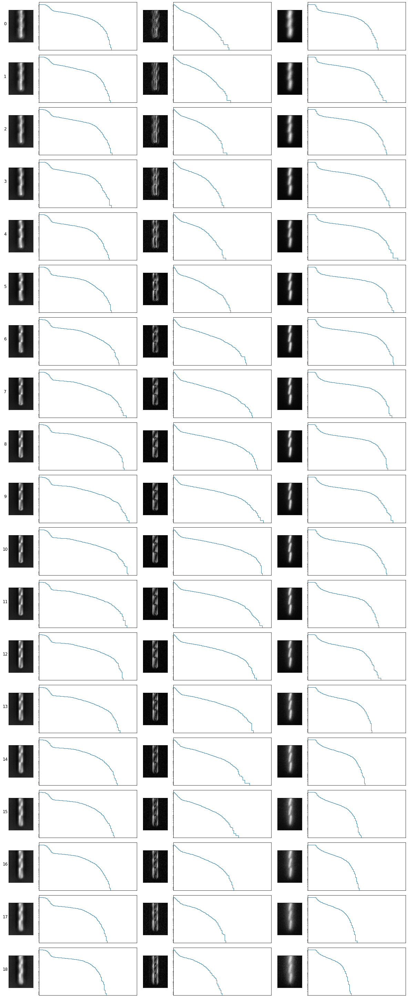

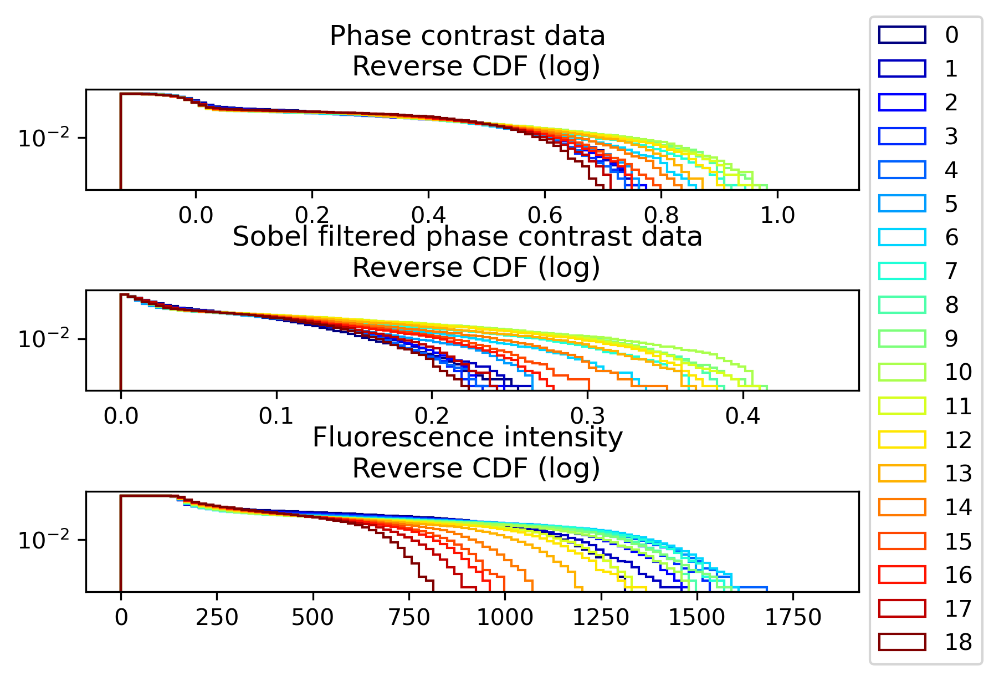

In [196]:
gl1=str(29)
plot_results(gl1)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18] ['/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220819_ace/20220819_ace_zstacks_1_1_preproc/Pos0/Pos0_GL16/20220819_ace_zstacks_downwards_1_1_MMStack_Pos0_GL16.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220819_ace/20220819_ace_zstacks_1_1_preproc/Pos1/Pos1_GL16/20220819_ace_zstacks_downwards_1_1_MMStack_Pos1_GL16.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220819_ace/20220819_ace_zstacks_1_1_preproc/Pos2/Pos2_GL16/20220819_ace_zstacks_downwards_1_1_MMStack_Pos2_GL16.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220819_ace/20220819_ace_zstacks_1_1_preproc/Pos3/Pos3_GL16/20220819_ace_zstacks_downwards_1_1_MMStack_Pos3_GL16.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220819_ace/20220819_ace_zstacks_1_1_preproc/Pos4/Pos4_GL16/20220819_ace_zstacks_downwards_1_1_MMStack_Pos4_GL16.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220819_ace/20220819_ace_zstacks_1_1_preproc/Pos5/Pos5_

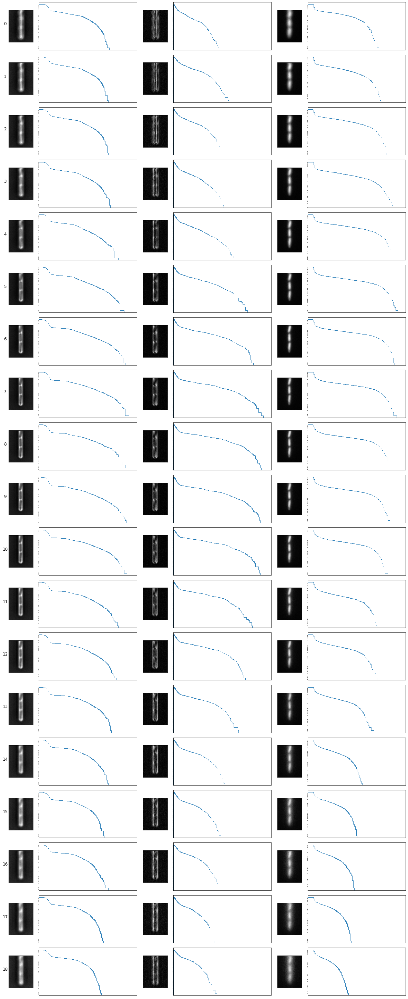

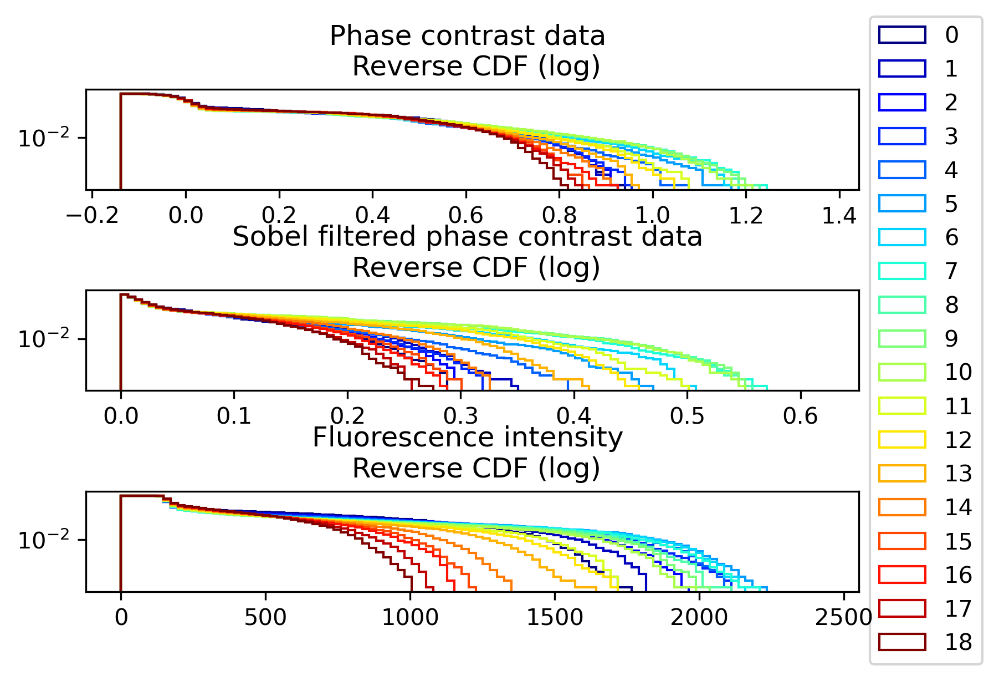

In [197]:
gl1=str(16)
plot_results(gl1)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18] ['/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220819_ace/20220819_ace_zstacks_1_1_preproc/Pos0/Pos0_GL1/20220819_ace_zstacks_downwards_1_1_MMStack_Pos0_GL1.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220819_ace/20220819_ace_zstacks_1_1_preproc/Pos1/Pos1_GL1/20220819_ace_zstacks_downwards_1_1_MMStack_Pos1_GL1.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220819_ace/20220819_ace_zstacks_1_1_preproc/Pos2/Pos2_GL1/20220819_ace_zstacks_downwards_1_1_MMStack_Pos2_GL1.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220819_ace/20220819_ace_zstacks_1_1_preproc/Pos3/Pos3_GL1/20220819_ace_zstacks_downwards_1_1_MMStack_Pos3_GL1.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220819_ace/20220819_ace_zstacks_1_1_preproc/Pos4/Pos4_GL1/20220819_ace_zstacks_downwards_1_1_MMStack_Pos4_GL1.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220819_ace/20220819_ace_zstacks_1_1_preproc/Pos5/Pos5_GL1/202208

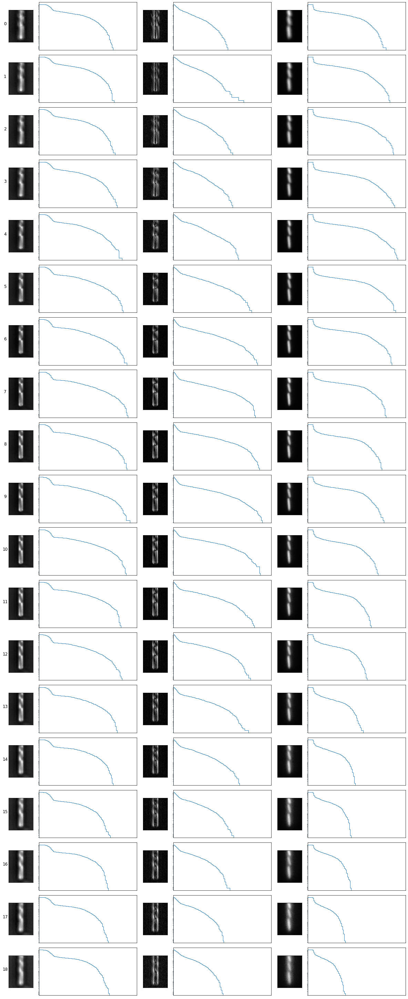

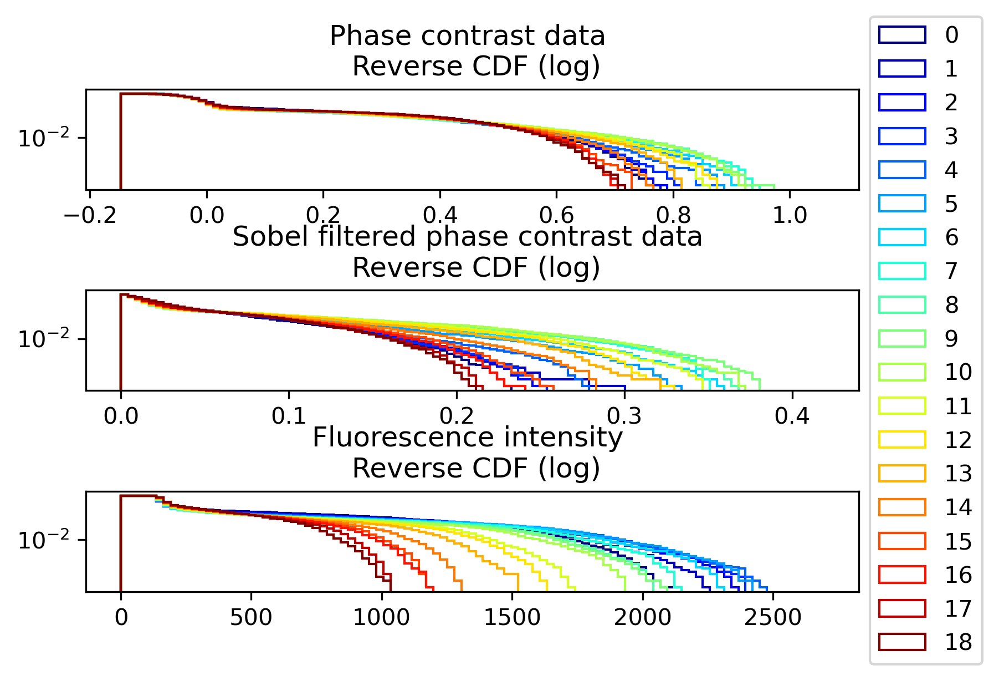

In [198]:
gl1=str(1)
plot_results(gl1)

# Upwards (not suitable...)

In [200]:
def plot_results(gl):
    rootPath="/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220819_ace/20220819_ace_zstacks_upwards_2_1_preproc/"
    fileList=glob.glob(rootPath+"/**/**/*GL%s.tif"%(gl))
    #order the list by positions
    posList=[int(re.search("Pos([0-9]{1,})",f).group(1)) for f in fileList]
    fileList=[x for _,x in sorted(zip(posList,fileList))]
    posList=sorted(posList)
    #[x for _, x in sorted(zip(Y, X))]
    print(posList,fileList)
    #posList=posList[0:2]
    #fileList=fileList[0:2]
    top_cutoff=120
    # Overview of positions and distributions
    fig,axs=plt.subplots(len(fileList),6,gridspec_kw={'width_ratios': [1,4,1,4,1,4]})
    fig.set_size_inches(20,50)
    #fig.set_dpi(300)
    
    k=0
    vmax_phc=0#np.max(im[0, :,:,0])*1.1
    vmax_sobel=0#np.max(im_sobel)*1.1
    vmax_fluo=0#np.max(im[0, :,:,1])*1.1
    
    vmin_phc=0#np.max(im[0, :,:,0])*1.1
    vmin_sobel=0#np.max(im_sobel)*1.1
    vmin_fluo=0#np.max(im[0, :,:,1])*1.1
    
    #searching for max to plot
    for f,p in zip(fileList,posList):
      im = io.imread(f)
      im_sobel = np.abs(sobel_v(im[0, top_cutoff:,:,0]))
      vmax_phc=np.max([vmax_phc,np.max(im[0, top_cutoff:,:,0])*1.1])
      vmax_sobel=np.max([vmax_sobel,np.max(im_sobel)*1.1])
      vmax_fluo=np.max([vmax_fluo,np.max(im[0, top_cutoff:,:,2])*1.1])
    
      vmin_phc=np.min([vmin_phc,np.min(im[0, top_cutoff:,:,0])*0.9])
      vmin_sobel=np.min([vmin_sobel,np.min(im_sobel)*0.9])
      vmin_fluo=np.min([vmin_fluo,np.min(im[0, top_cutoff:,:,2])*0.9])
        
      #print(f)
      #print(np.max(im_sobel))

    for f,p in zip(fileList,posList):
      im = io.imread(f)
      im_sobel = np.abs(sobel_v(im[0, top_cutoff:,:,0]))                                     
      #print("Pos"+str(p)+", phase contrast")
      axs[k,0].set_ylabel(p,size="large",rotation=0,labelpad=10)
      axs[k,0].imshow(im[0, top_cutoff:,:,0],vmin=np.min(im[0,top_cutoff:,:,0]),vmax=np.max(im[0, top_cutoff:,:,0]),cmap='gray')
      #plt.show()
      axs[k,1].hist(im[0, top_cutoff:,:,0].flatten(),bins=np.linspace(vmin_phc,vmax_phc,100),density=True, histtype='step',cumulative=-1,
        label='Reversed emp.',log=True)  
      axs[k,1].set_xlim(vmin_phc,vmax_phc)
      axs[k,2].imshow(im_sobel,vmin=np.min(im_sobel),vmax=np.max(im_sobel),cmap='gray')
      axs[k,3].hist(im_sobel.flatten(),bins=np.linspace(vmin_sobel,vmax_sobel,100),density=True, histtype='step', cumulative=-1,
        label='Reversed emp.',log=True)
      axs[k,3].set_xlim(0,vmax_sobel)
      #plt.yscale('log')
      axs[k,4].imshow(im[0,top_cutoff:,:,2],vmin=np.min(im[0, top_cutoff:,:,2]),vmax=np.max(im[0, top_cutoff:,:,2]),cmap='gray')
      axs[k,5].hist(im[0,top_cutoff:,:,2].flatten(),bins=np.linspace(vmin_fluo,vmax_fluo,100),density=True, histtype='step', cumulative=-1,
        label='Reversed emp.',log=True)
      axs[k,5].set_xlim(vmin_fluo,vmax_fluo)

      #print(np.max(im[0,:,:,0]))
      #print("Pos"+str(p)+", sobel filter")
      #plt.show()
      k+=1

    for i in range(0,np.shape(axs)[0]):
        for j in range(0,np.shape(axs)[1]):
          axs[i,j].set_yticks([])
          axs[i,j].set_xticks([])

    plt.subplots_adjust(left=0.1,
                        bottom=0.1, 
                        right=0.9, 
                        top=0.9, 
                        wspace=0.1, 
                        hspace=0.1)

    plt.savefig("./plot_downwards_%s.pdf"%(gl))
    plt.show()

    # Super imposing distributions (sobel filter, phase contrast and gfp intensities)
    ## Setting color map
    n=len(fileList)
    col = pl.cm.jet([0.25,0.75])  
    colors = pl.cm.jet(np.linspace(0,1,n))


    fig,axs=plt.subplots(3)
    fig.set_dpi(300)
    
    
    ## List of matrices
    matrices_array_phc=np.array([io.imread(f)[0,top_cutoff:,:,0] for f in fileList])
    np.shape(matrices_array_phc)
    # Plotting sobel results
    for i in range(0,np.shape(matrices_array_phc)[0]):
      #print(fileList[i])
      #print(np.max(matrices_array_sobel[i,:,:]))
      #print(matrices_array_sobel[i,:,:])
      axs[0].hist(matrices_array_phc[i,:,:].flatten(),bins=np.linspace(vmin_phc,vmax_phc,100),density=True, histtype='step', cumulative=-1,
        label='Reversed emp.',log=True,color=colors[i])
    #axs[0].legend(posList,loc='center left', bbox_to_anchor=(1, 0.5))
    axs[0].set_title("Phase contrast data \n Reverse CDF (log)")

    ## List of matrices
    matrices_array_sobel=np.array([np.abs(sobel_v(io.imread(f)[0,top_cutoff:,:,0])) for f in fileList])
    np.shape(matrices_array_sobel)
    # Plotting sobel results
    for i in range(0,np.shape(matrices_array_sobel)[0]):
      #print(fileList[i])
      #print(np.max(matrices_array_sobel[i,:,:]))
      #print(matrices_array_sobel[i,:,:])
      axs[1].hist(matrices_array_sobel[i,:,:].flatten(),bins=np.linspace(vmin_sobel,vmax_sobel,100),density=True, histtype='step', cumulative=-1,
        label='Reversed emp.',log=True,color=colors[i])
    axs[1].legend(posList,loc='center left', bbox_to_anchor=(1, 0.5))
    axs[1].set_title("Sobel filtered phase contrast data \n Reverse CDF (log)")

    # Plotting gfp intensities results
    matrices_array_gfp=np.array([io.imread(f)[0,top_cutoff:,:,2] for f in fileList])
    #np.shape(matrices_array_gfp)
    for i in range(0,np.shape(matrices_array_gfp)[0]):
      axs[2].hist(matrices_array_gfp[i,:,:].flatten(),bins=np.linspace(vmin_fluo,vmax_fluo,100),density=True, histtype='step', cumulative=-1,
        label='Reversed emp.',log=True,color=colors[i])
    #axs[1].legend(posList,loc='center left', bbox_to_anchor=(1, 0.5))
    axs[2].set_title("Fluorescence intensity \n Reverse CDF (log)")
    #fig.tight_layout()
    plt.subplots_adjust(wspace=0.1, 
                        hspace=1)
    plt.savefig("./plot_all_distributions_downwards_%s.pdf"%(gl),bbox_inches='tight')
    plt.show()

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22] ['/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220819_ace/20220819_ace_zstacks_upwards_2_1_preproc/Pos0/Pos0_GL5/20220819_ace_zstacks_upwards_2_1_MMStack_Pos0_GL5.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220819_ace/20220819_ace_zstacks_upwards_2_1_preproc/Pos1/Pos1_GL5/20220819_ace_zstacks_upwards_2_1_MMStack_Pos1_GL5.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220819_ace/20220819_ace_zstacks_upwards_2_1_preproc/Pos2/Pos2_GL5/20220819_ace_zstacks_upwards_2_1_MMStack_Pos2_GL5.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220819_ace/20220819_ace_zstacks_upwards_2_1_preproc/Pos3/Pos3_GL5/20220819_ace_zstacks_upwards_2_1_MMStack_Pos3_GL5.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220819_ace/20220819_ace_zstacks_upwards_2_1_preproc/Pos4/Pos4_GL5/20220819_ace_zstacks_upwards_2_1_MMStack_Pos4_GL5.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220819_ace/2022081

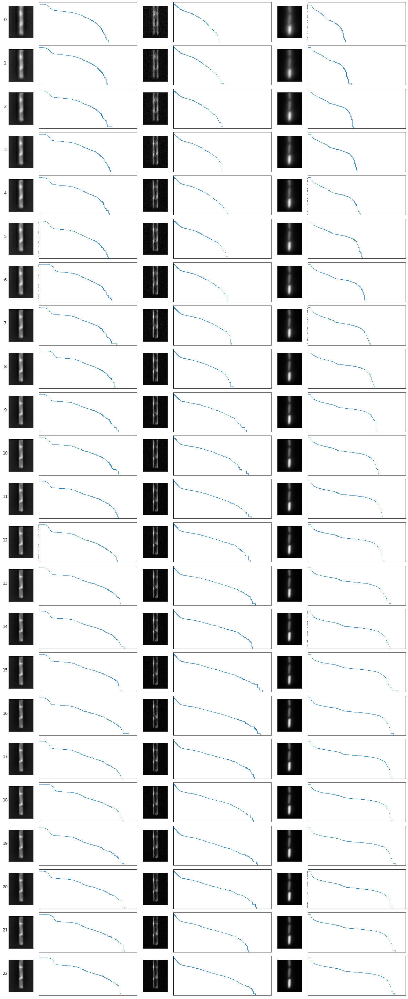

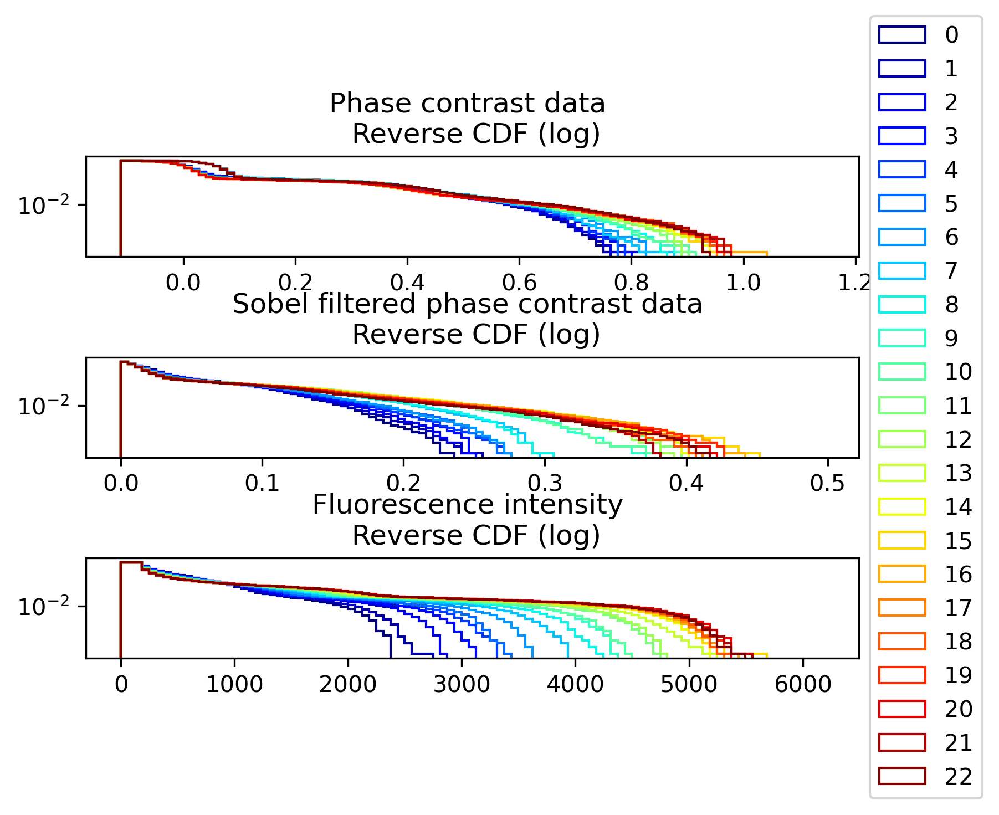

In [202]:
gl1=str(5)
plot_results(gl1)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22] ['/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220819_ace/20220819_ace_zstacks_upwards_2_1_preproc/Pos0/Pos0_GL17/20220819_ace_zstacks_upwards_2_1_MMStack_Pos0_GL17.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220819_ace/20220819_ace_zstacks_upwards_2_1_preproc/Pos1/Pos1_GL17/20220819_ace_zstacks_upwards_2_1_MMStack_Pos1_GL17.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220819_ace/20220819_ace_zstacks_upwards_2_1_preproc/Pos2/Pos2_GL17/20220819_ace_zstacks_upwards_2_1_MMStack_Pos2_GL17.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220819_ace/20220819_ace_zstacks_upwards_2_1_preproc/Pos3/Pos3_GL17/20220819_ace_zstacks_upwards_2_1_MMStack_Pos3_GL17.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220819_ace/20220819_ace_zstacks_upwards_2_1_preproc/Pos4/Pos4_GL17/20220819_ace_zstacks_upwards_2_1_MMStack_Pos4_GL17.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220819_a

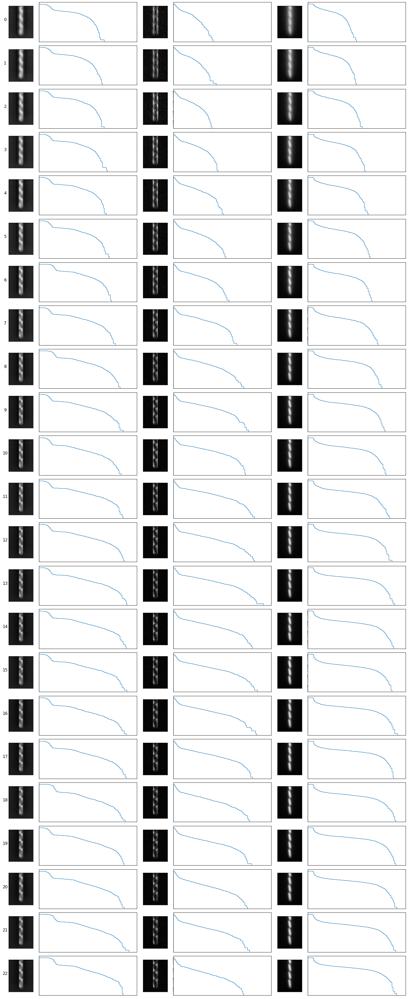

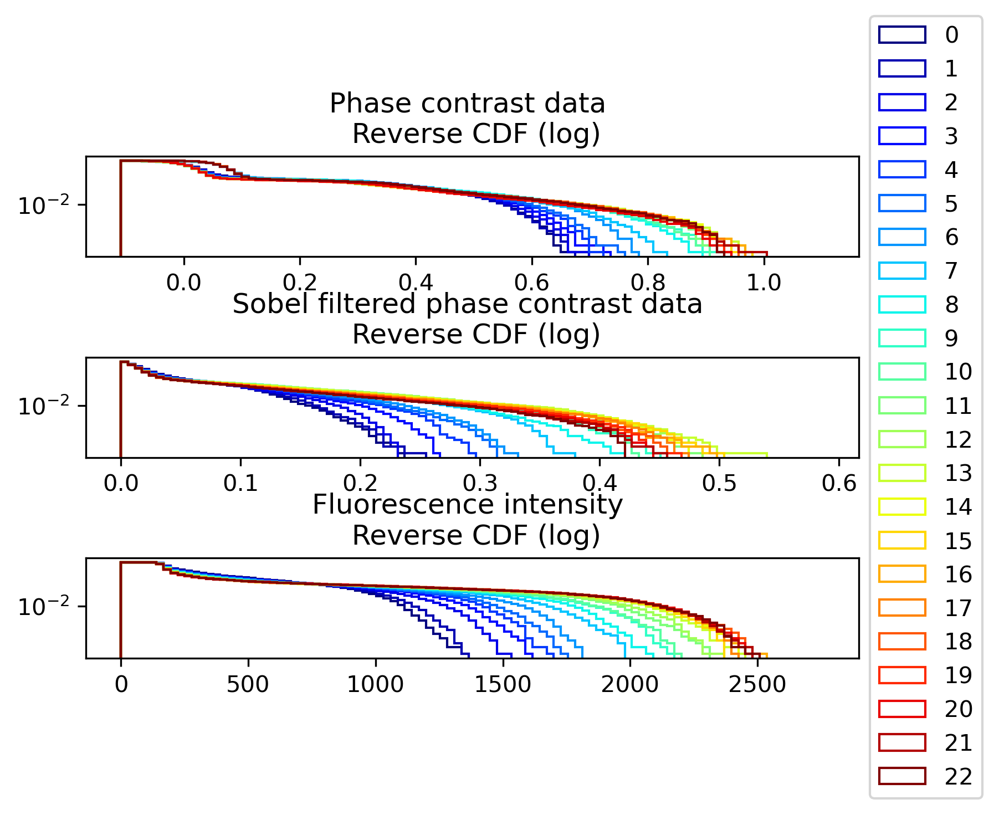

In [203]:
gl1=str(17)
plot_results(gl1)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22] ['/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220819_ace/20220819_ace_zstacks_upwards_2_1_preproc/Pos0/Pos0_GL29/20220819_ace_zstacks_upwards_2_1_MMStack_Pos0_GL29.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220819_ace/20220819_ace_zstacks_upwards_2_1_preproc/Pos1/Pos1_GL29/20220819_ace_zstacks_upwards_2_1_MMStack_Pos1_GL29.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220819_ace/20220819_ace_zstacks_upwards_2_1_preproc/Pos2/Pos2_GL29/20220819_ace_zstacks_upwards_2_1_MMStack_Pos2_GL29.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220819_ace/20220819_ace_zstacks_upwards_2_1_preproc/Pos3/Pos3_GL29/20220819_ace_zstacks_upwards_2_1_MMStack_Pos3_GL29.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220819_ace/20220819_ace_zstacks_upwards_2_1_preproc/Pos4/Pos4_GL29/20220819_ace_zstacks_upwards_2_1_MMStack_Pos4_GL29.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220819_a

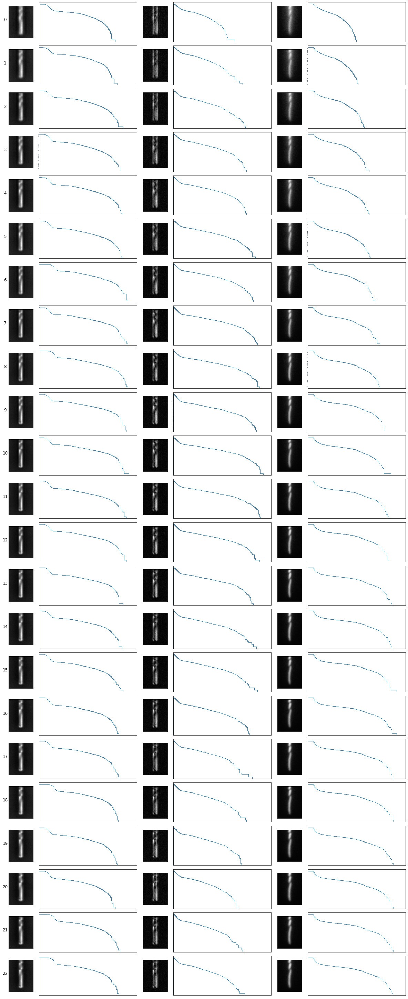

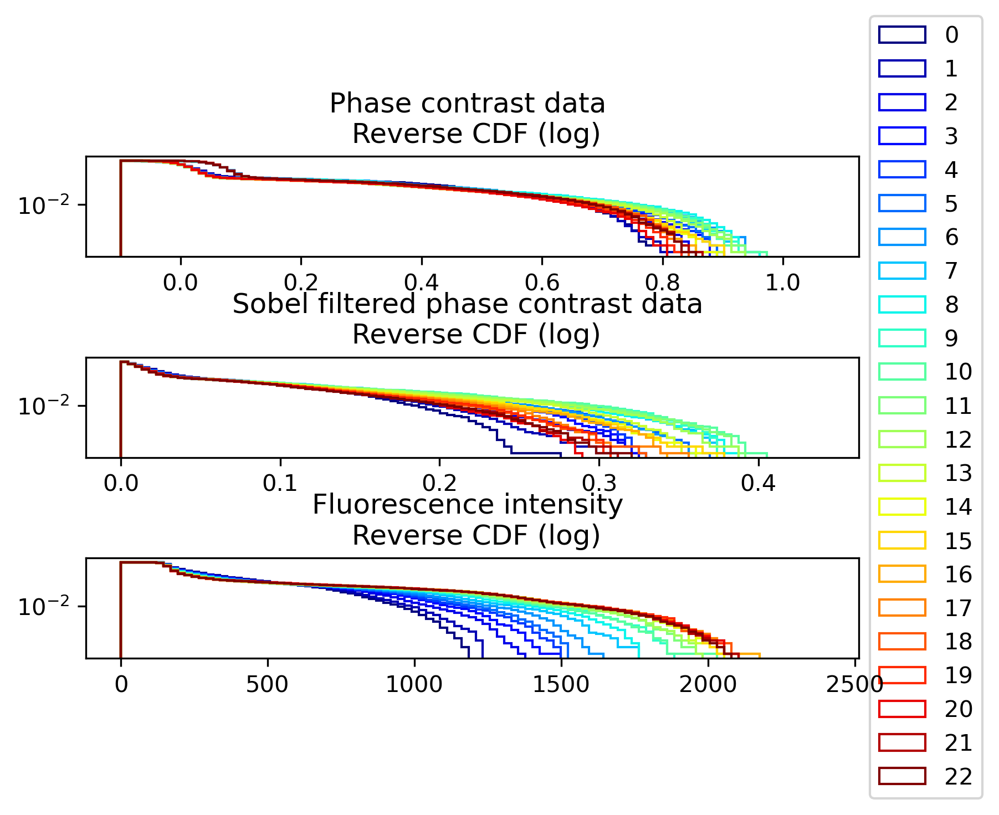

In [204]:
gl1=str(29)
plot_results(gl1)

# Run the analysis for all posible growth lanes

29 29 29


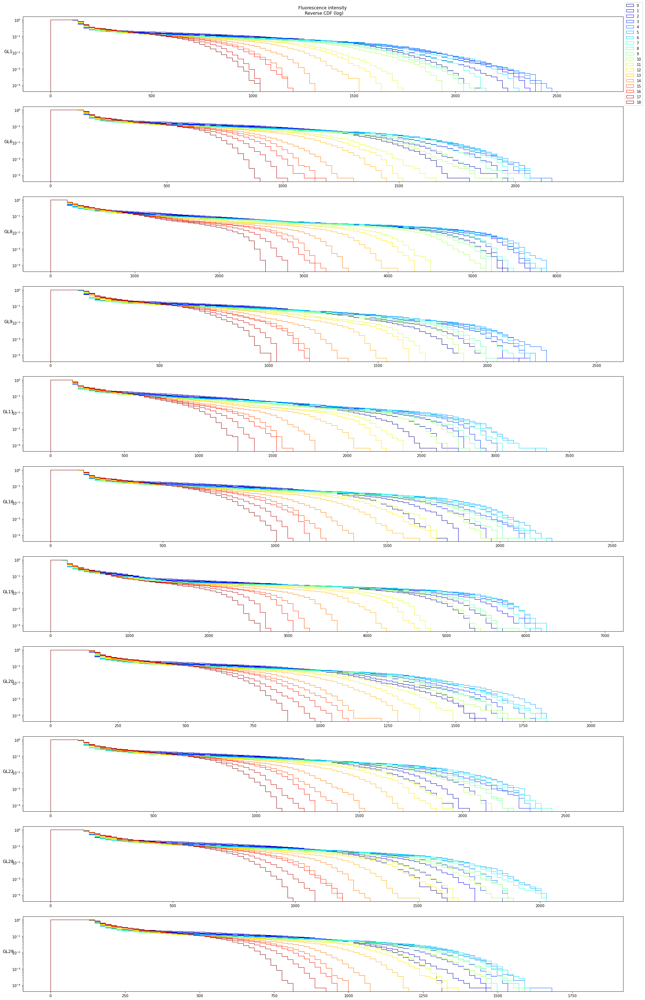

In [261]:
gl=str(1)
top_cutoff=120
rootPath="/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220819_ace/20220819_ace_zstacks_1_1_preproc/"
glRange=range(1,30)
fileListList=[]
posListList=[]
n=19
k=0
gls=[]

for gl in glRange:
    #print(glob.glob(rootPath+"/**/**/*GL%s.tif"%(str(gl))))
    fileList=glob.glob(rootPath+"/**/**/*GL%s.tif"%(str(gl)))
    #order the list by positions
    if fileList != []:
        posList=[int(re.search("Pos([0-9]{1,})",f).group(1)) for f in fileList]
        fileList=[x for _,x in sorted(zip(posList,fileList))]
        posList=sorted(posList)
        fileListList=fileListList+[fileList]
        posListList=posListList+[posList]
        gls+=[str(gl)]
        
## Setting color map
col = pl.cm.jet([0.25,0.75])  
colors = pl.cm.jet(np.linspace(0,1,n))

print(len(gls),len(fileListList),len(posListList))


fluo_filter=[True]*len(gls)
vmax_fluo_list=[0]*len(gls)
for m,fs in zip(range(0,len(gls)),fileListList):
    
    #vmax_fluo=0
    for f,p in zip(fs,posListList[m]):
        im = io.imread(f)
        vmax_fluo_list[m]=np.max([vmax_fluo_list[m],np.max(im[0, top_cutoff:,:,2])*1.1])        

indices=[i for i in range(0,len(gls)) if vmax_fluo_list[i]>400]

fig,axs=plt.subplots(len(indices),1,squeeze=False)
fig.set_size_inches(30,50)
        
for h,m in zip(range(0,len(indices)),indices):
    fs=fileListList[m]
    matrices_array_gfp=np.array([io.imread(f)[0,top_cutoff:,:,2] for f in fs])
    for i in range(0,len(fs)):
        axs[h,0].hist(matrices_array_gfp[i,:,:].flatten(),bins=np.linspace(0,vmax_fluo_list[m],100),density=True, histtype='step', cumulative=-1,label='Reversed emp.',log=True,color=colors[i])
        axs[h,0].set_ylabel("GL%s"%(gls[m]),size="large",rotation=0,labelpad=10)


axs[0,0].legend(posList,loc='center left', bbox_to_anchor=(1, 0.5))
axs[0,0].set_title("Fluorescence intensity \n Reverse CDF (log)")

plt.savefig("./plot_all_distributions_across_gls.pdf",bbox_inches='tight')
plt.show()

# Load data from Lis (20220818), Stacy microscope (impossible to preprocess these)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 34] ['/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220727glu/preprocessing_20220728glu_upwards_1_1/Pos0/Pos0_GL27/20220728glu_upwards_1_1_MMStack_Pos0_GL27.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220727glu/preprocessing_20220728glu_upwards_1_1/Pos1/Pos1_GL27/20220728glu_upwards_1_1_MMStack_Pos1_GL27.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220727glu/preprocessing_20220728glu_upwards_1_1/Pos2/Pos2_GL27/20220728glu_upwards_1_1_MMStack_Pos2_GL27.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220727glu/preprocessing_20220728glu_upwards_1_1/Pos3/Pos3_GL27/20220728glu_upwards_1_1_MMStack_Pos3_GL27.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220727glu/preprocessing_20220728glu_upwards_1_1/Pos4/Pos4_GL27/20220728glu_upwards_1_1_MMStack_Pos4_GL27.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220727glu/preprocessing_20220

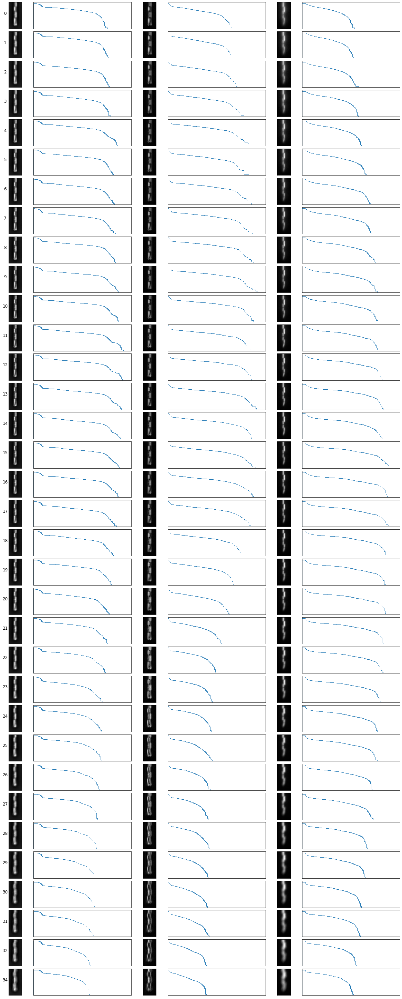

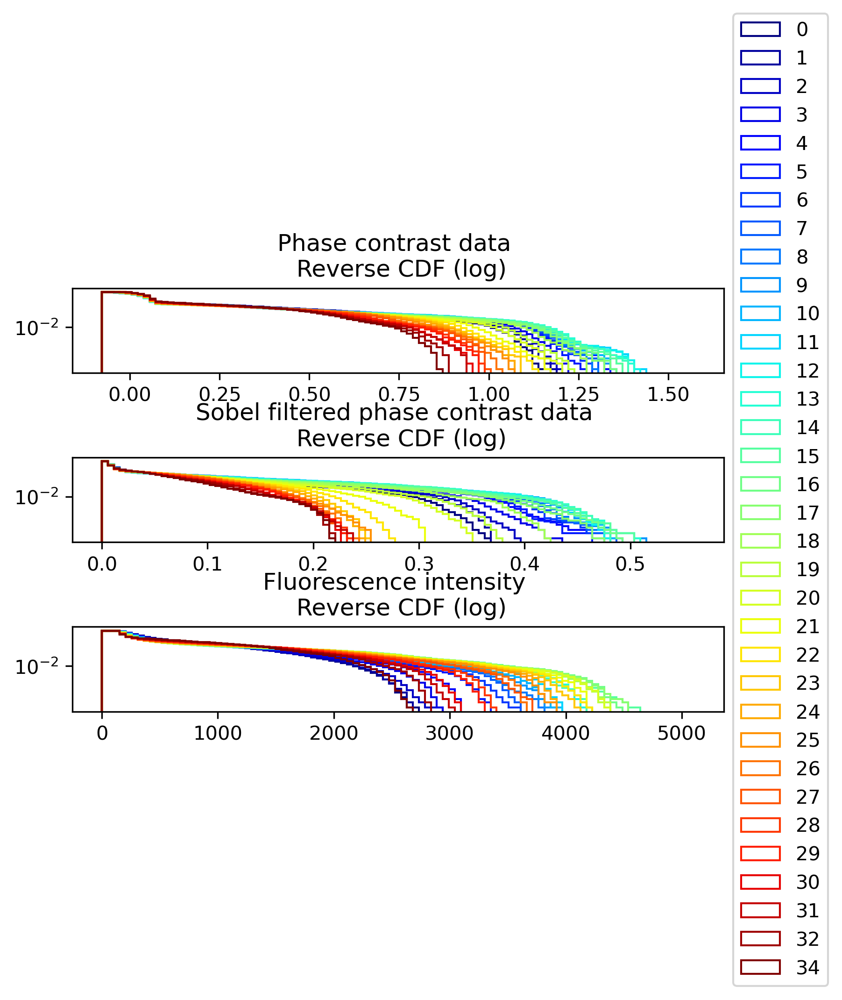

In [263]:
gl1=str(27)
plot_results(gl1)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 34] ['/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220727glu/preprocessing_20220728glu_upwards_1_1/Pos0/Pos0_GL15/20220728glu_upwards_1_1_MMStack_Pos0_GL15.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220727glu/preprocessing_20220728glu_upwards_1_1/Pos1/Pos1_GL15/20220728glu_upwards_1_1_MMStack_Pos1_GL15.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220727glu/preprocessing_20220728glu_upwards_1_1/Pos2/Pos2_GL15/20220728glu_upwards_1_1_MMStack_Pos2_GL15.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220727glu/preprocessing_20220728glu_upwards_1_1/Pos3/Pos3_GL15/20220728glu_upwards_1_1_MMStack_Pos3_GL15.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220727glu/preprocessing_20220728glu_upwards_1_1/Pos4/Pos4_GL15/20220728glu_upwards_1_1_MMStack_Pos4_GL15.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220727glu/preprocessing_20220

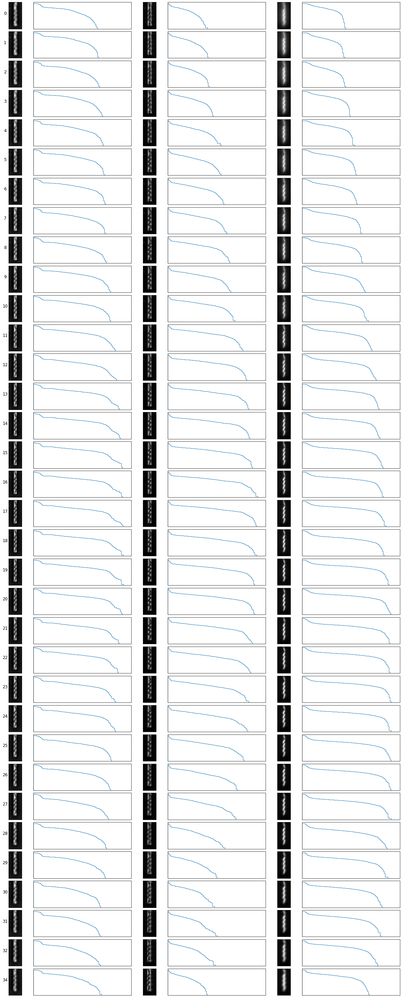

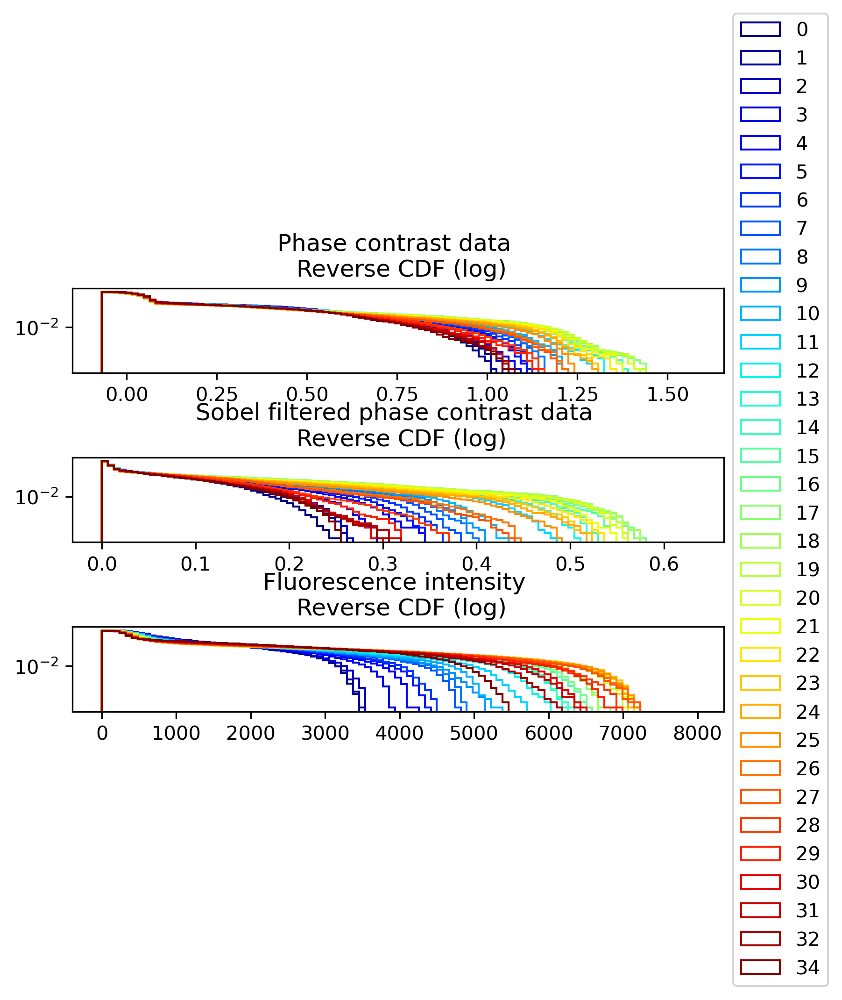

In [264]:
gl1=str(15)
plot_results(gl1)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 34] ['/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220727glu/preprocessing_20220728glu_upwards_1_1/Pos0/Pos0_GL3/20220728glu_upwards_1_1_MMStack_Pos0_GL3.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220727glu/preprocessing_20220728glu_upwards_1_1/Pos1/Pos1_GL3/20220728glu_upwards_1_1_MMStack_Pos1_GL3.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220727glu/preprocessing_20220728glu_upwards_1_1/Pos2/Pos2_GL3/20220728glu_upwards_1_1_MMStack_Pos2_GL3.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220727glu/preprocessing_20220728glu_upwards_1_1/Pos3/Pos3_GL3/20220728glu_upwards_1_1_MMStack_Pos3_GL3.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220727glu/preprocessing_20220728glu_upwards_1_1/Pos4/Pos4_GL3/20220728glu_upwards_1_1_MMStack_Pos4_GL3.tif', '/scicore/home/nimwegen/rocasu25/MM_Data/Dany/20220727glu/preprocessing_20220728glu_upw

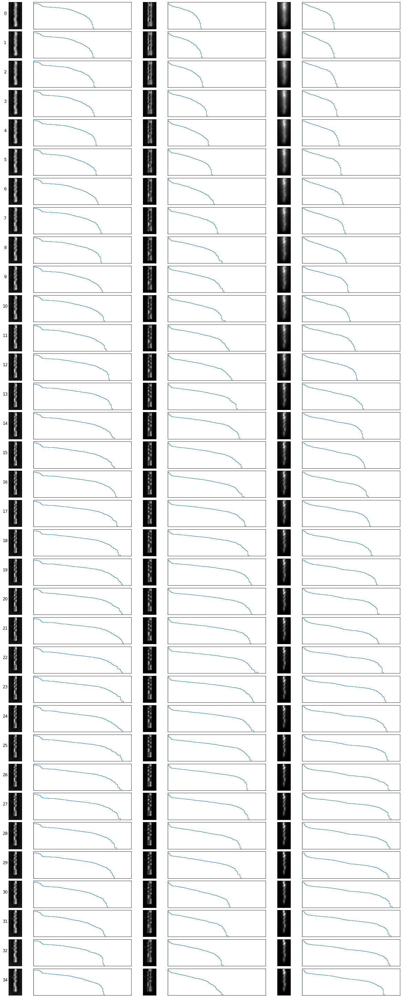

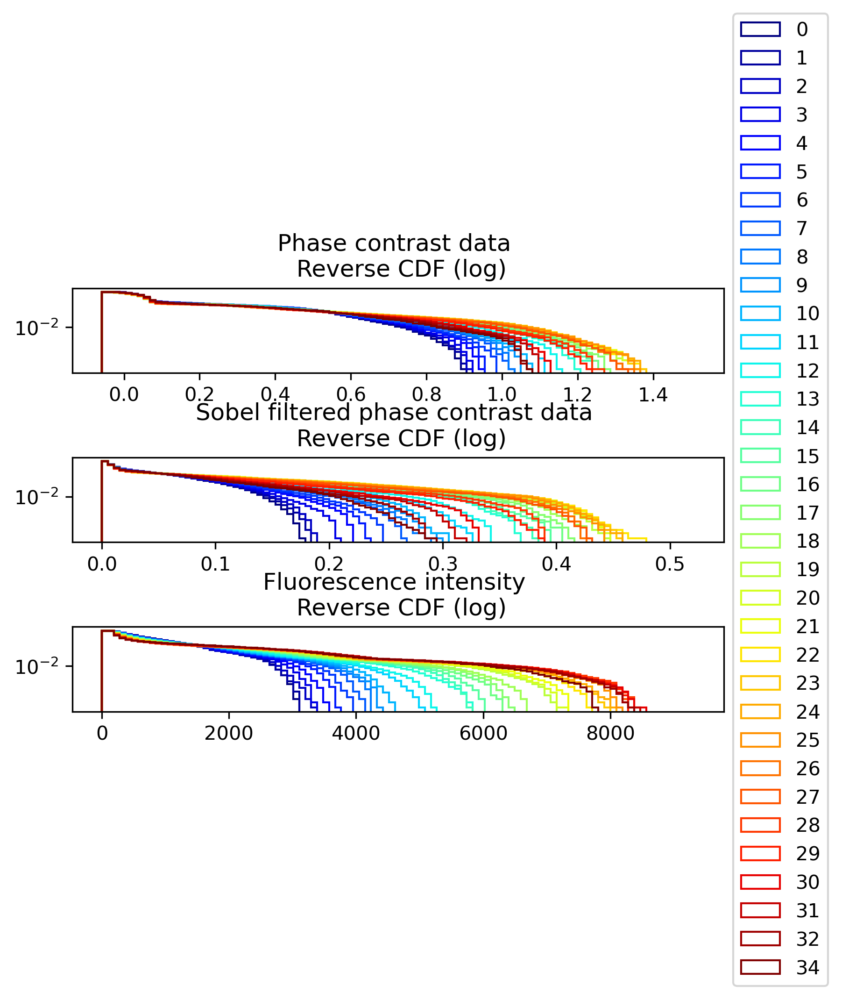

In [265]:
gl1=str(3)
plot_results(gl1)